In [6]:
###load packages
import numpy as np
import pandas as pd

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
import sklearn
print(sklearn.__version__)


1.4.2


In [10]:
#TF-IDF calculates importance of a word relative to the collection
from sklearn.feature_extraction.text import TfidfVectorizer
#For text cleaning
import neattext.functions as nfx

In [11]:
#loading dataset
cols =["id", "text", "label"]
df = pd.read_csv("text.csv", names = cols, low_memory = False, skiprows = 1)

In [12]:
df

,id,text,label
0,0,i just feel really helpless and heavy hearted,4
1,1,ive enjoyed being able to slouch about relax a...,0
2,2,i gave up my internship with the dmrg and am f...,4
3,3,i dont know i feel so lost,0
4,4,i am a kindergarten teacher and i am thoroughl...,4
...,...,...,...
416804,416804,i feel like telling these horny devils to find...,2
416805,416805,i began to realize that when i was feeling agi...,3
416806,416806,i feel very curious be why previous early dawn...,5
416807,416807,i feel that becuase of the tyranical nature of...,3


In [13]:
df["label"].unique()

array([4, 0, 2, 1, 5, 3], dtype=int64)

In [14]:
df.head()

,id,text,label
0,0,i just feel really helpless and heavy hearted,4
1,1,ive enjoyed being able to slouch about relax a...,0
2,2,i gave up my internship with the dmrg and am f...,4
3,3,i dont know i feel so lost,0
4,4,i am a kindergarten teacher and i am thoroughl...,4


#Creating visuals to see the difference between the different columns and sentiments

In [15]:
emotions = {
    0: "sadness",
    1: "joy",
    2: "love",
    3: "anger",
    4: "fear",
    5: "surprise"
}


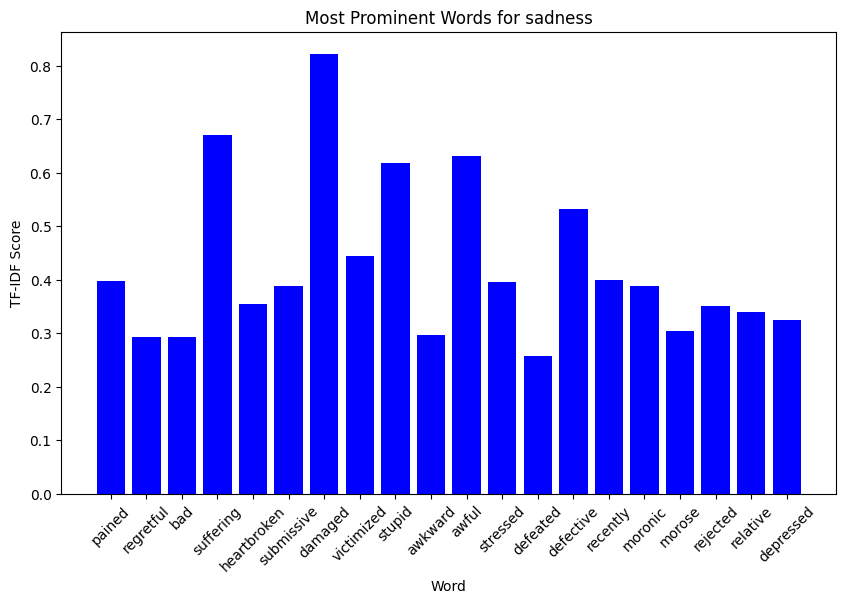

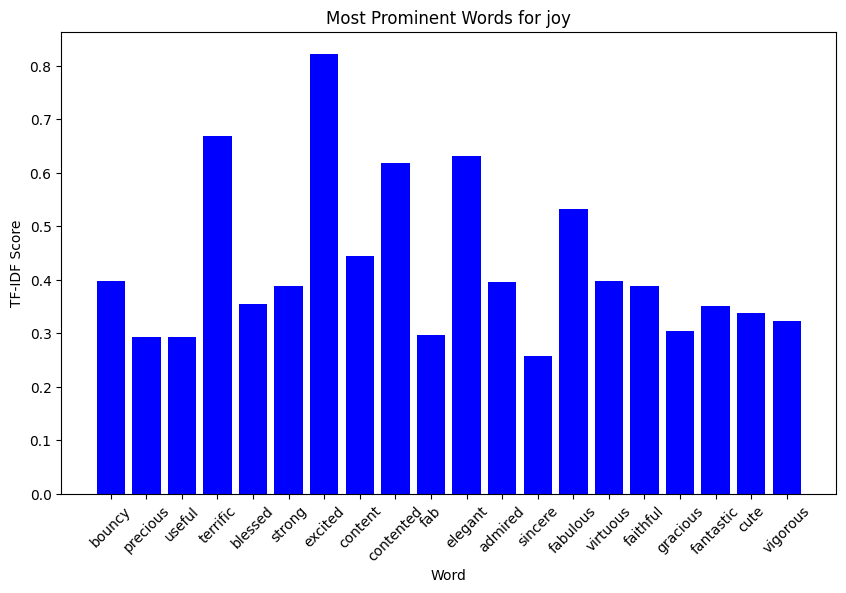

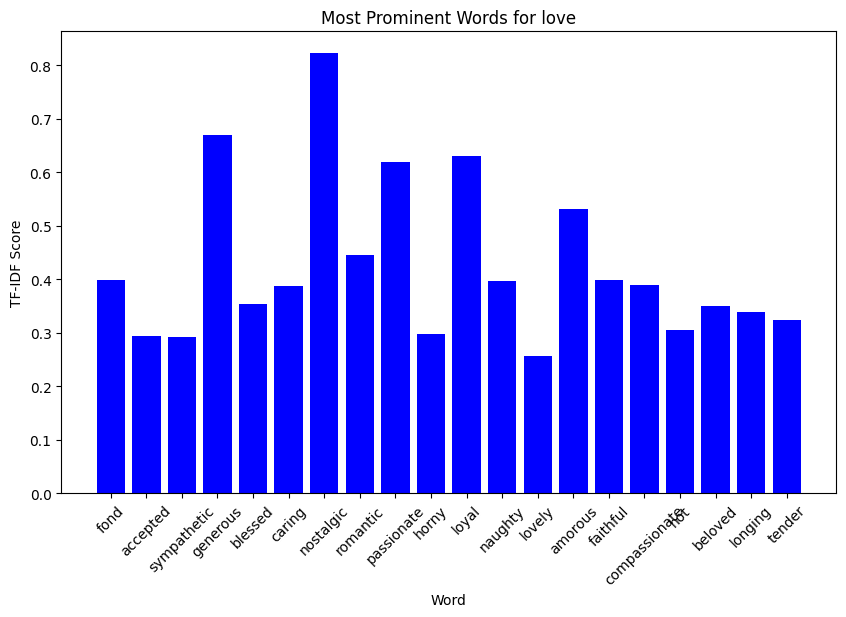

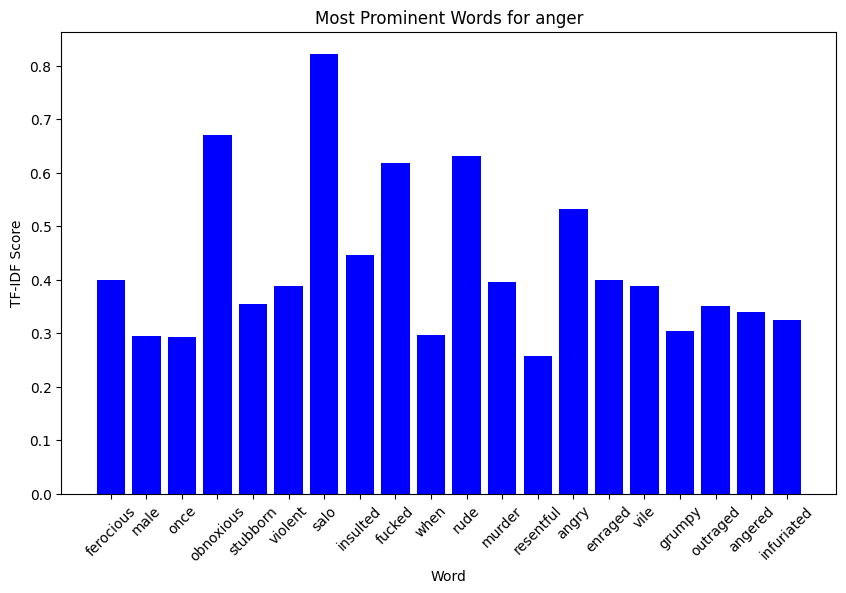

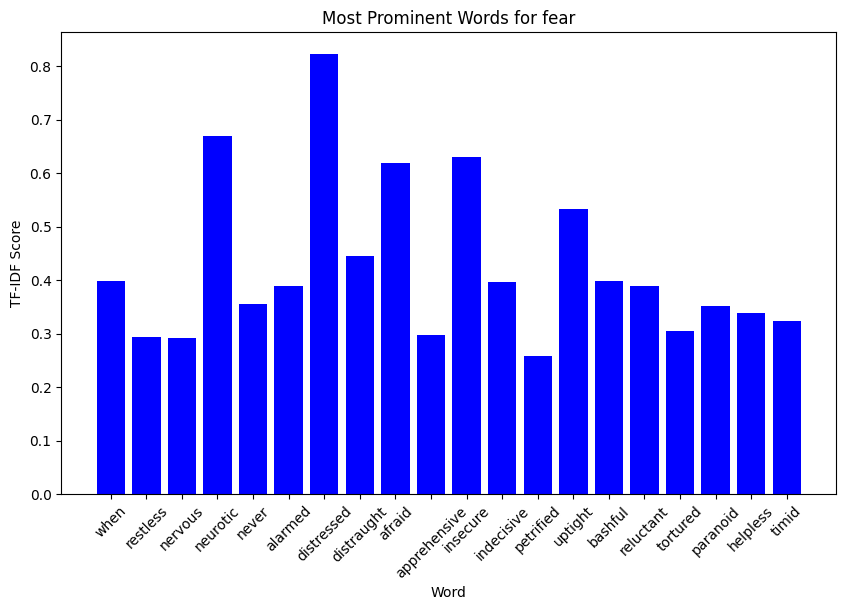

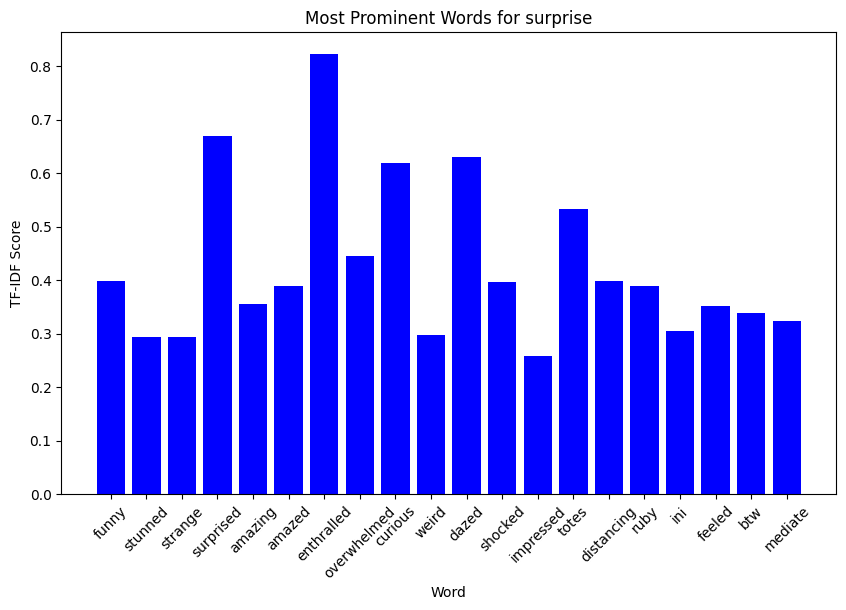

In [16]:
#defines stopwords and potentially more irrelevant words
stopWords = ["feel", "feeling", "really", "like", "get", "still", "in", 'im']

#initializes TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words=stopWords)

# fits and transform the text data for each emotion
tfidfMatrixByEmotion = {}
for sentiment, emotion in emotions.items():
    #filtering text data by emotion label
    textData = df[df['label'] == sentiment]['text']
    
    # fitting and transforming TF-IDF vectorizer
    tfidfMatrix = tfidf_vectorizer.fit_transform(textData)
    
    # gets feature words and corresponding scores
    featureNames = tfidf_vectorizer.get_feature_names_out()
    tfidfScores = tfidfMatrix.max(axis=0).toarray().flatten()
    
    #sort feature names by scores
    sortedIndices = tfidfScores.argsort()[::-1]
    sortedFeatureNames = [featureNames[idx] for idx in sortedIndices]
    
    #stores the most prominent words for the current emotion
    tfidfMatrixByEmotion[emotion] = sortedFeatureNames[:20]  # top 20 most prominent words

# plotting the most prominent words for each emotion category
for emotion, prominentWords in tfidfMatrixByEmotion.items():
    plt.figure(figsize=(10, 6))
    plt.bar(prominentWords, tfidfScores[:20], color='blue')
    plt.xlabel('Word')
    plt.ylabel('TF-IDF Score')
    plt.title(f'Most Prominent Words for {emotion}')
    plt.xticks(rotation=45)
    plt.show()

In [17]:
example = df ['text'][50]
print(example)

i have wished her the best and i truly feel as though i am sincere about this


In [18]:
df.dtypes

id        int64
text     object
label     int64
dtype: object

In [19]:
df.isnull().sum()

id       0
text     0
label    0
dtype: int64

In [20]:
df['label'].map(emotions).value_counts()

label
joy         141067
sadness     121187
anger        57317
fear         47712
love         34554
surprise     14972
Name: count, dtype: int64

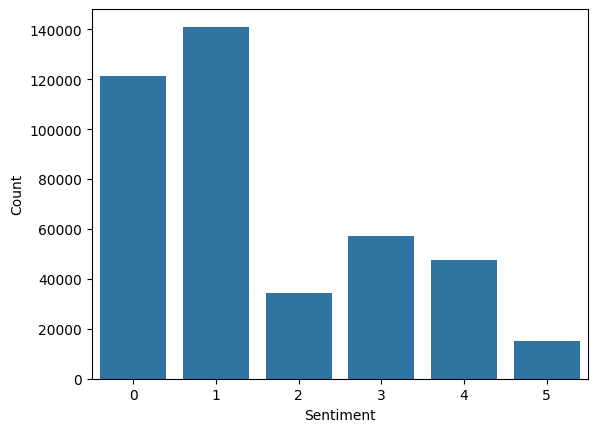

In [21]:
sns.countplot(x='label', data=df)
plt.xlabel('Sentiment')  # Set x-label
plt.ylabel('Count')  # Set y-label
plt.show()

### Exploration 
+ Sentiment Analysis
+ Text cleaning
+ Keyword extraction 
    - Keywords for each emotion
    - Wordclooud to see for each sentiment

In [23]:
#sentiment analysis
from textblob import TextBlob

In [24]:
def getSentiment(text):
    blob = TextBlob(text)
    sentiment = blob.sentiment.polarity
    if sentiment > 0:
        result = "Positive"
    elif sentiment < 0:
        result = "Negative"
    else:
        result = "Neutral"
    return result

In [25]:
#testing example
getSentiment("i miss all the others as well that feel that i wronged them and they will soon understand that i didnt")

'Neutral'

In [26]:
df['Sentiment'] = df['text'].apply(getSentiment)

In [36]:
df

,id,text,label,Sentiment,emotion
0,0,i just feel really helpless and heavy hearted,4,Neutral,fear
1,1,ive enjoyed being able to slouch about relax a...,0,Positive,sadness
2,2,i gave up my internship with the dmrg and am f...,4,Negative,fear
3,3,i dont know i feel so lost,0,Neutral,sadness
4,4,i am a kindergarten teacher and i am thoroughl...,4,Neutral,fear
...,...,...,...,...,...
416804,416804,i feel like telling these horny devils to find...,2,Positive,love
416805,416805,i began to realize that when i was feeling agi...,3,Neutral,anger
416806,416806,i feel very curious be why previous early dawn...,5,Negative,surprise
416807,416807,i feel that becuase of the tyranical nature of...,3,Positive,anger


In [27]:
df.head()

,id,text,label,Sentiment
0,0,i just feel really helpless and heavy hearted,4,Neutral
1,1,ive enjoyed being able to slouch about relax a...,0,Positive
2,2,i gave up my internship with the dmrg and am f...,4,Negative
3,3,i dont know i feel so lost,0,Neutral
4,4,i am a kindergarten teacher and i am thoroughl...,4,Neutral


In [28]:
#comparing emotion vs sentiment
df.groupby([df['label'].map(emotions), 'Sentiment']).size()

label     Sentiment
anger     Negative      27973
          Neutral       13594
          Positive      15750
fear      Negative      21572
          Neutral       11883
          Positive      14257
joy       Negative      14334
          Neutral       20096
          Positive     106637
love      Negative       6641
          Neutral        5049
          Positive      22864
sadness   Negative      58676
          Neutral       29722
          Positive      32789
surprise  Negative       5974
          Neutral        1342
          Positive       7656
dtype: int64

### ROBERTA Model for sentiment


In [39]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [40]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

c:\Users\kokol\anaconda3\envs\myenv3.11\Lib\site-packages\huggingface_hub\file_download.py:148: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\kokol\.cache\huggingface\hub\models--cardiffnlp--twitter-roberta-base-sentiment. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


In [65]:
example = "im so sad"
print(example)

polarityScoresRoberta(example)

im so sad


{'robertaNeg': 0.90656793,
 'robertaNeu': 0.081972234,
 'reobertaPos': 0.011459933}

In [49]:
encodedText = tokenizer(example, return_tensors='pt')
output= model(**encodedText)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores
#N/N/P

scoresDict={
    'robertaNeg' : scores[0],
    'robertaNeu' : scores[1],
    'reobertaPos' : scores[2]
}
print(scoresDict)

{'robertaNeg': 0.9726465, 'robertaNeu': 0.02424218, 'reobertaPos': 0.003111333}


In [50]:
def polarityScoresRoberta(example):
    encodedText = tokenizer(example, return_tensors='pt')
    output= model(**encodedText)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores
    #N/N/P

    scoresDict={
        'robertaNeg' : scores[0],
        'robertaNeu' : scores[1],
        'reobertaPos' : scores[2]
    }
    return(scoresDict)

In [53]:
from tqdm.notebook import tqdm

In [61]:
res = {}
for i, row in df.iterrows():
    text = row['text']
    myid = row['id']
    robertaRes = polarityScoresRoberta(text)
    break

In [62]:
robertaRes

{'robertaNeg': 0.95112634,
 'robertaNeu': 0.04471717,
 'reobertaPos': 0.004156461}

In [66]:
import torch
import torch.nn as nn

In [69]:
#splitting dataset
from sklearn.model_selection import train_test_split

In [71]:
train_df, val_df = train_test_split(df, test_size=0.1, random_state=42)

In [75]:
from transformers import Trainer, TrainingArguments

In [73]:
# Convert labels to torch tensors
train_labels = torch.tensor(train_df['label'].tolist())
val_labels = torch.tensor(val_df['label'].tolist())

### Matplotlib

<Axes: xlabel='label,Sentiment'>

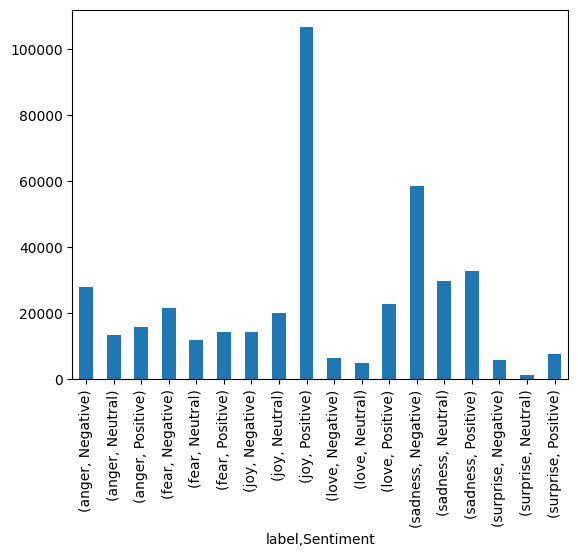

In [29]:
#First method using matplotlib
#compare out emotion vs sentiment
emotion = df['label'].map(emotions)
df.groupby([df['label'].map(emotions), 'Sentiment']).size().plot(kind= 'bar')

In [30]:
#using seaborn 
sns.catplot

<function seaborn.categorical.catplot(data=None, *, x=None, y=None, hue=None, row=None, col=None, kind='strip', estimator='mean', errorbar=('ci', 95), n_boot=1000, seed=None, units=None, weights=None, order=None, hue_order=None, row_order=None, col_order=None, col_wrap=None, height=5, aspect=1, log_scale=None, native_scale=False, formatter=None, orient=None, color=None, palette=None, hue_norm=None, legend='auto', legend_out=True, sharex=True, sharey=True, margin_titles=False, facet_kws=None, ci=<deprecated>, **kwargs)>

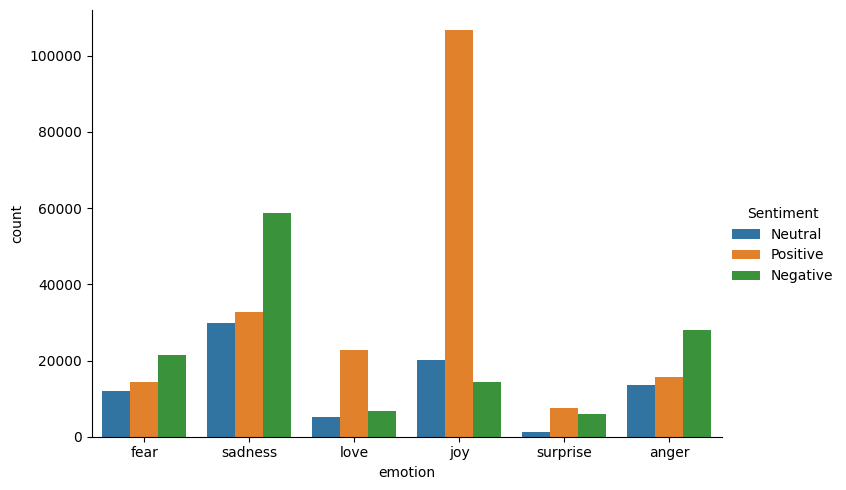

In [31]:
df['emotion'] = df['label'].map(emotions)
sns.catplot(x='emotion', hue = 'Sentiment', data=df, kind = 'count', aspect = 1.5)

### Text Cleaning 
+ Remove noise
    - stopwords
    - special characters
    - punctuation
    - emojis

In [26]:
#gives different aspects of words such as contractions, emojis to help clean text
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [27]:
df['clean_text'] = df['text'].apply(nfx.remove_userhandles)

In [28]:
df['clean_text'] = df['text'].apply(nfx.remove_punctuations)

In [29]:
df['clean_text'] = df['text'].apply(nfx.remove_stopwords)

In [30]:
df[['text', 'clean_text']]

,text,clean_text
0,i just feel really helpless and heavy hearted,feel helpless heavy hearted
1,ive enjoyed being able to slouch about relax a...,ive enjoyed able slouch relax unwind frankly n...
2,i gave up my internship with the dmrg and am f...,gave internship dmrg feeling distraught
3,i dont know i feel so lost,dont know feel lost
4,i am a kindergarten teacher and i am thoroughl...,kindergarten teacher thoroughly weary job take...
...,...,...
416804,i feel like telling these horny devils to find...,feel like telling horny devils find site suite...
416805,i began to realize that when i was feeling agi...,began realize feeling agitated restless though...
416806,i feel very curious be why previous early dawn...,feel curious previous early dawn time seek tro...
416807,i feel that becuase of the tyranical nature of...,feel becuase tyranical nature government el sa...


### Keyword Extraction
+ Extracting the most predominant word per class of emotion

In [31]:
from collections import Counter

In [32]:
myStopWords = ["feel", "feeling", "really", "like", "get", "still", "in", 'im', "ive"]

def extractKeywords(text, num=50):
    # Initialize TF-IDF vectorizer
    tfidf_vectorizer = TfidfVectorizer(stop_words=myStopWords)
    
    # Fit and transform the text data
    tfidf_matrix = tfidf_vectorizer.fit_transform([text])
    
    # Get feature names (words)
    feature_names = tfidf_vectorizer.get_feature_names_out()
    
    # Get TF-IDF scores for each feature
    tfidf_scores = tfidf_matrix.toarray()[0]
    
    # Create a dictionary of words and their TF-IDF scores
    word_scores = dict(zip(feature_names, tfidf_scores))
    
    # Sort words by their TF-IDF scores
    sorted_words = sorted(word_scores.items(), key=lambda x: x[1], reverse=True)
    
    # Get the top num words
    top_keywords = {word: score for word, score in sorted_words[:num]}
    
    return top_keywords

In [33]:
# list of emotions
emotionList = df['label'].unique().tolist()

In [34]:
emotionList

[4, 0, 2, 1, 5, 3]

In [35]:
sadnessList = df[df['label'] == 0]['clean_text'].tolist()
joyList = df[df['label'] == 1]['clean_text'].tolist()
loveList = df[df['label'] == 2]['clean_text'].tolist()
angerList = df[df['label'] == 3]['clean_text'].tolist()
fearList = df[df['label'] == 4]['clean_text'].tolist()
surpriseList = df[df['label'] == 5]['clean_text'].tolist()

In [36]:
#sadness Document
sadnessDocx =' '.join(sadnessList)
joyDocx =' '.join(joyList)
loveDocx =' '.join(loveList)
angerDocx =' '.join(angerList)
fearDocx =' '.join(fearList)
surpriseDocx =' '.join(surpriseList)



In [37]:
sadnessDocx

'ive enjoyed able slouch relax unwind frankly needed weeks end uni expo lately started find feeling bit listless good thing dont know feel lost beginning feel disheartened lose weight feeling deprived im feeling little like damaged tree roots little wack feel stupid realise late feel submissive time lost interest bdsm stuff imagine reasons marriage hard theyll good bad ugly parts parts hard love feels awful feel like parts exposed people dont know feel like real fan fake fan needed integrating making connections feeling pretty homesick week feel disheartened message reply news found jason observation helpful restating truth learned years ago wife years went times love trust feel awful lot like letting admit inspiration direction feeling little melancholy making href http www found feeling hopeless future life kinda feeling come damaged wont returnable thing defect began feel doomed feel neglectful lot responding comments havent eye hate seeing feel nekkid sounds vain think look horrend

In [38]:
#Extract keywords from the sadness doc
keywordsSadness = extractKeywords(sadnessDocx)

In [39]:
keywordsSadness

{'know': 0.25899177076679203,
 'time': 0.22113274817106157,
 'little': 0.20620547640474501,
 'people': 0.17115883834469742,
 'want': 0.16538984442534804,
 'think': 0.16304619064561235,
 'life': 0.15388791279864517,
 'bit': 0.15046257265903146,
 'dont': 0.14822708751528357,
 'things': 0.13369643408092227,
 'way': 0.12457421244595104,
 'day': 0.1231319639661137,
 'going': 0.12075225397438206,
 'right': 0.10225541722046806,
 'cant': 0.10077711252863478,
 'pretty': 0.09980359480474457,
 'bad': 0.09392643224940737,
 'love': 0.09367403876543584,
 'feelings': 0.09356587012944803,
 'need': 0.08815743833005797,
 'sad': 0.08494843546241987,
 'didnt': 0.0818836574427655,
 'feels': 0.0815591515348021,
 'help': 0.07997267820698102,
 'lost': 0.07964817229901762,
 'today': 0.07961211608702168,
 'good': 0.07874676699911927,
 'hurt': 0.07748479957926159,
 'work': 0.07669156291535105,
 'left': 0.07485269610355844,
 'days': 0.07128313111596099,
 'depressed': 0.0695884891521521,
 'sorry': 0.06908370218420

In [40]:
# Define the plotMostCommonWords function
def plotByTF1Score(tfidf_scores, emotionName):
    # Convert dictionary to a DataFrame
    df01 = pd.DataFrame(tfidf_scores.items(), columns=['token', 'tfidf_score'])
    
    # Sort DataFrame by TF-IDF score in descending order
    df01 = df01.sort_values(by='tfidf_score', ascending=False)
    
    # Plot
    plt.figure(figsize=(20, 10))
    plt.title("{} Plotted by TF1 Scores".format(emotionName))
    sns.barplot(x='token', y='tfidf_score', data=df01)
    
    # Aesthetics
    plt.xticks(rotation=45)
    plt.show()

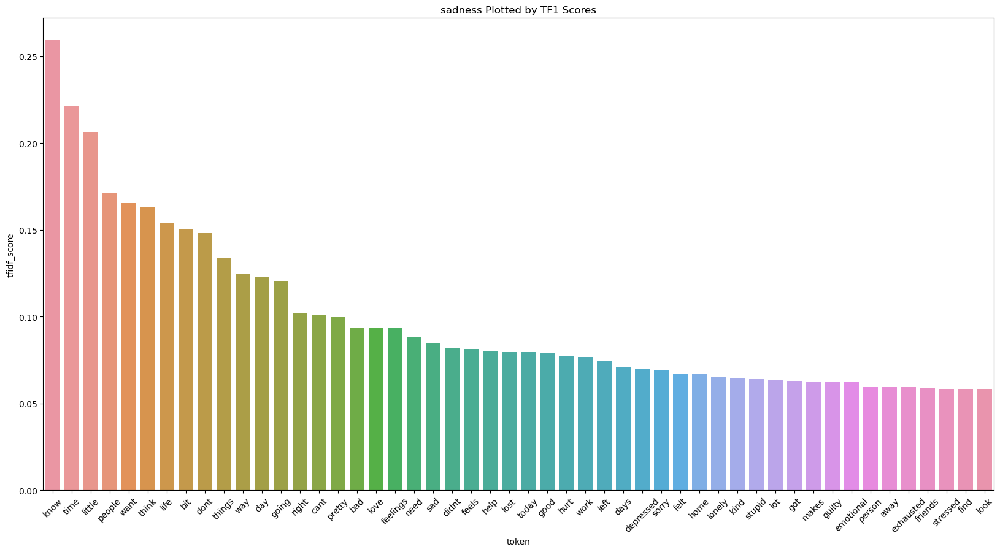

In [41]:
plotByTF1Score(keywordsSadness, "sadness")

In [42]:
keywordsJoy = extractKeywords(joyDocx)
keywordsLove = extractKeywords(loveDocx)
keywordsAnger = extractKeywords(angerDocx)
keywordsFear = extractKeywords(fearDocx)
keywordsSurprise = extractKeywords(surpriseDocx)

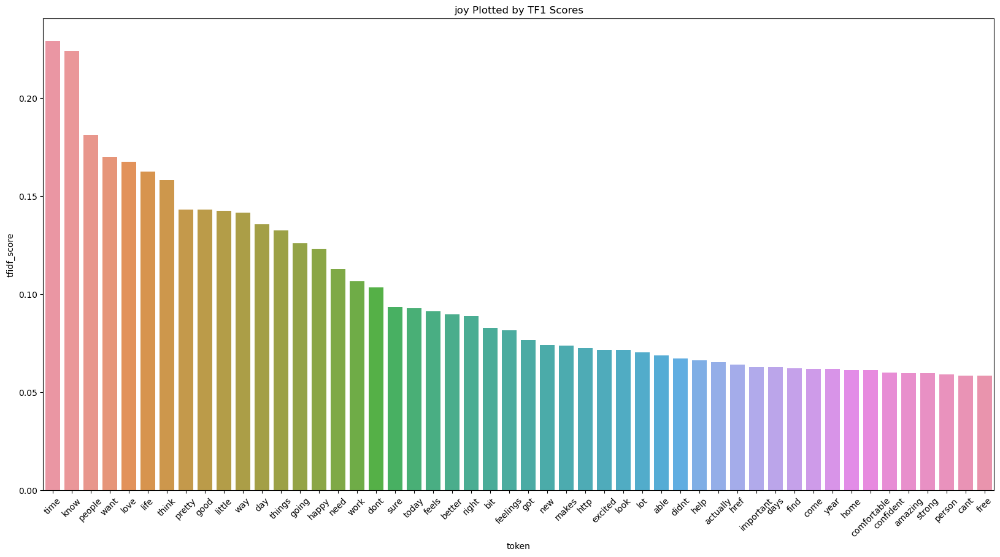

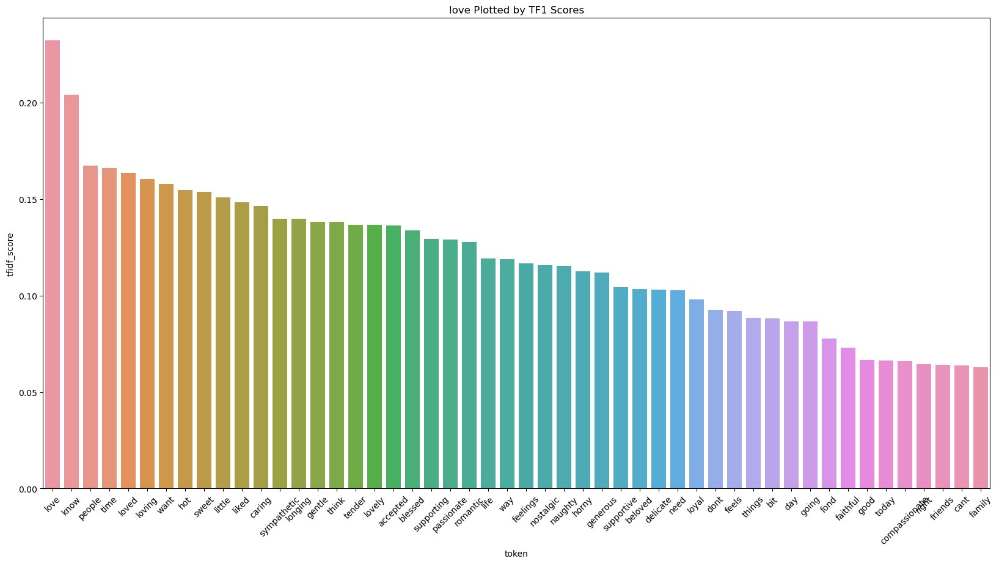

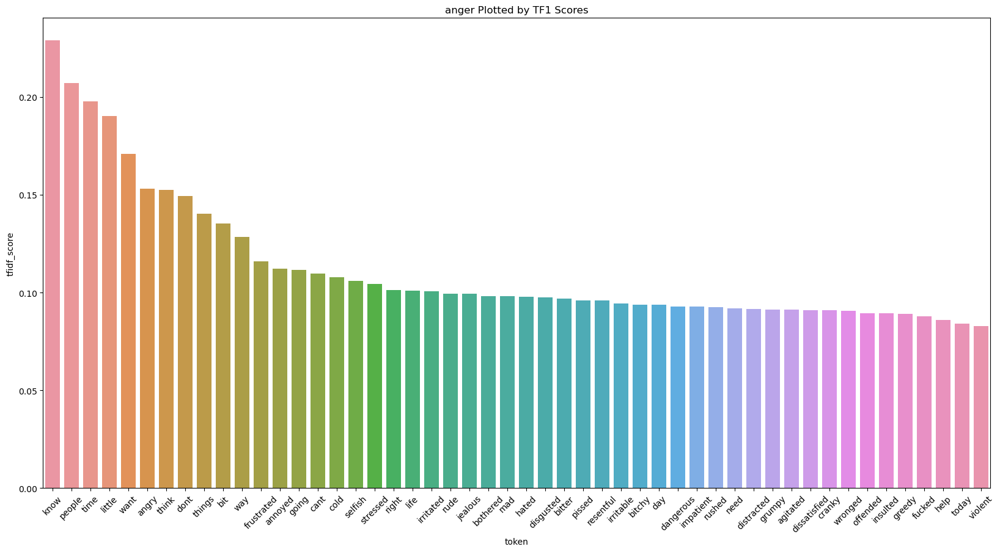

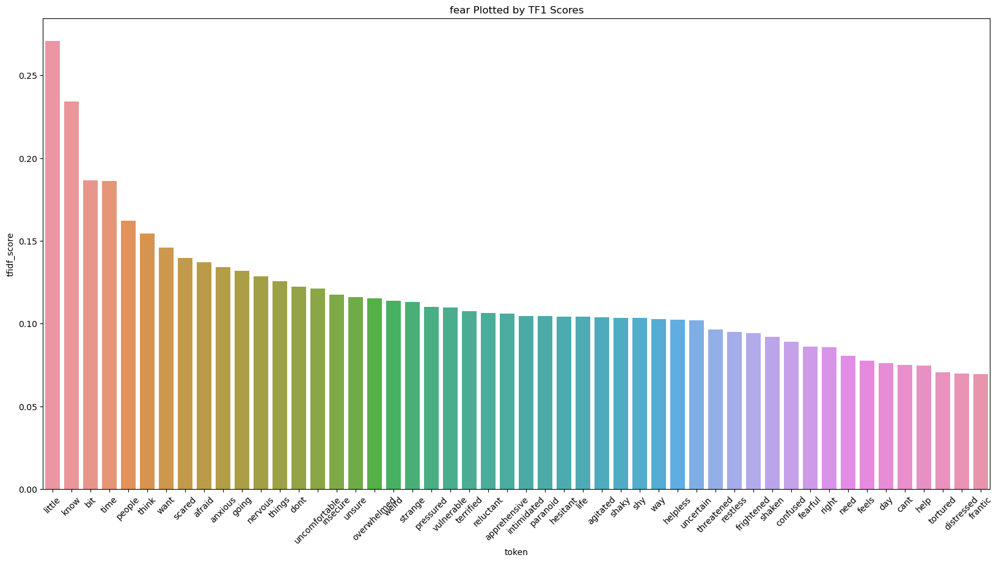

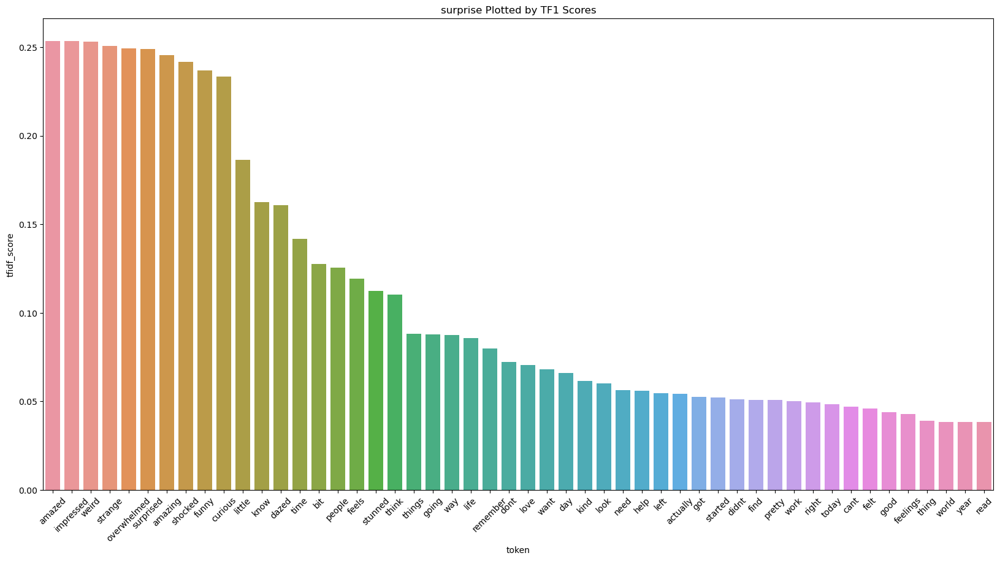

In [43]:
plotByTF1Score(keywordsJoy, "joy")
plotByTF1Score(keywordsLove, "love")
plotByTF1Score(keywordsAnger, "anger")
plotByTF1Score(keywordsFear, "fear")
plotByTF1Score(keywordsSurprise, "surprise")

In [44]:
###word cloud
from wordcloud import WordCloud

In [45]:
def plotWordCloud(docx):
    myWordCloud = WordCloud().generate(docx)
    plt.figure(figsize=(20,10))
    plt.imshow(myWordCloud, interpolation= 'bilinear')
    plt.axis('off')
    plt.show()

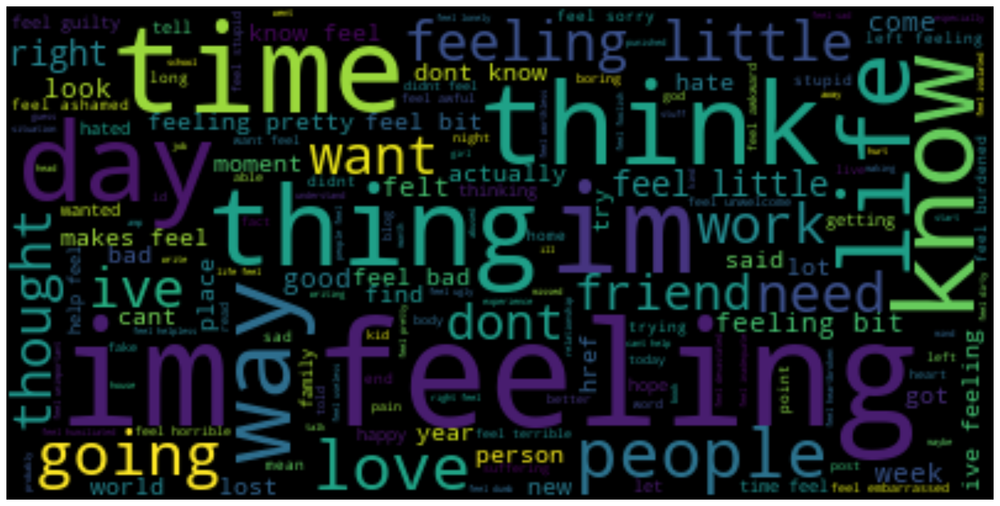

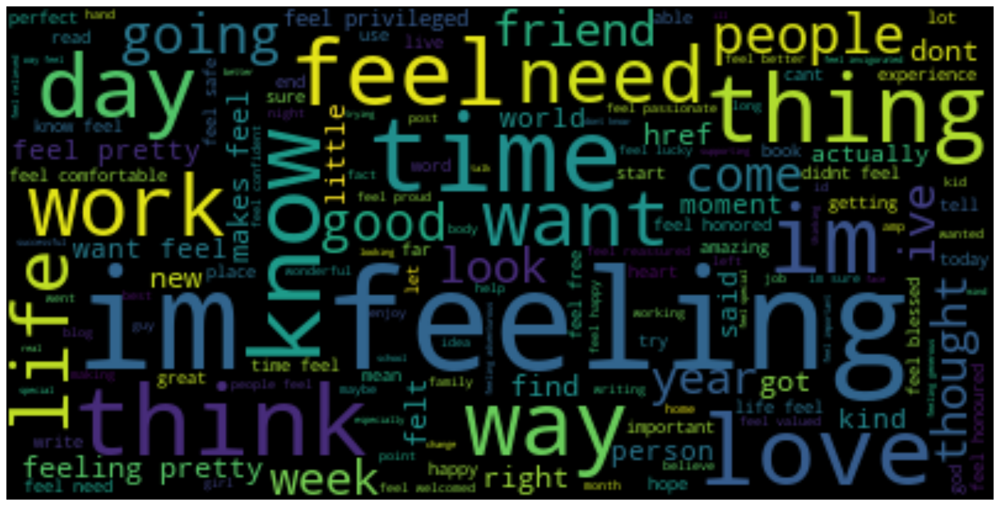

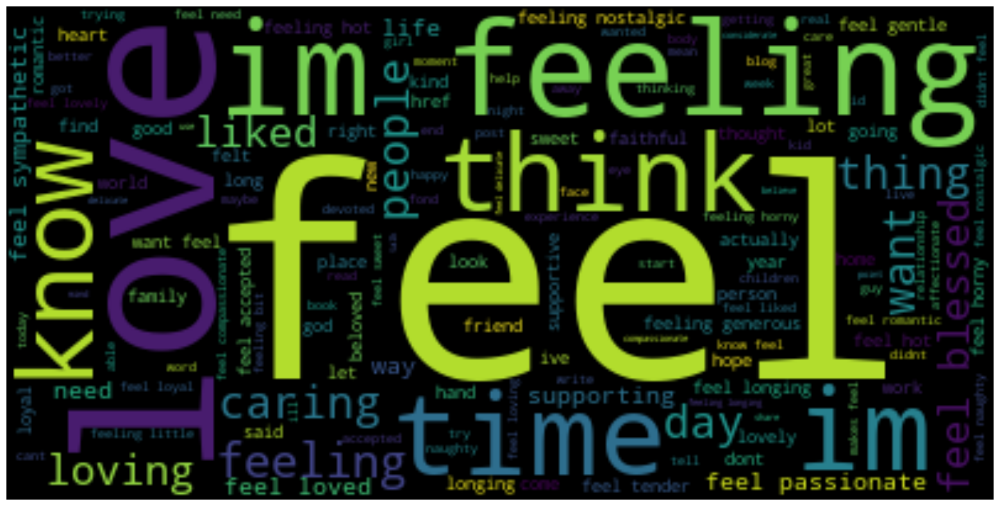

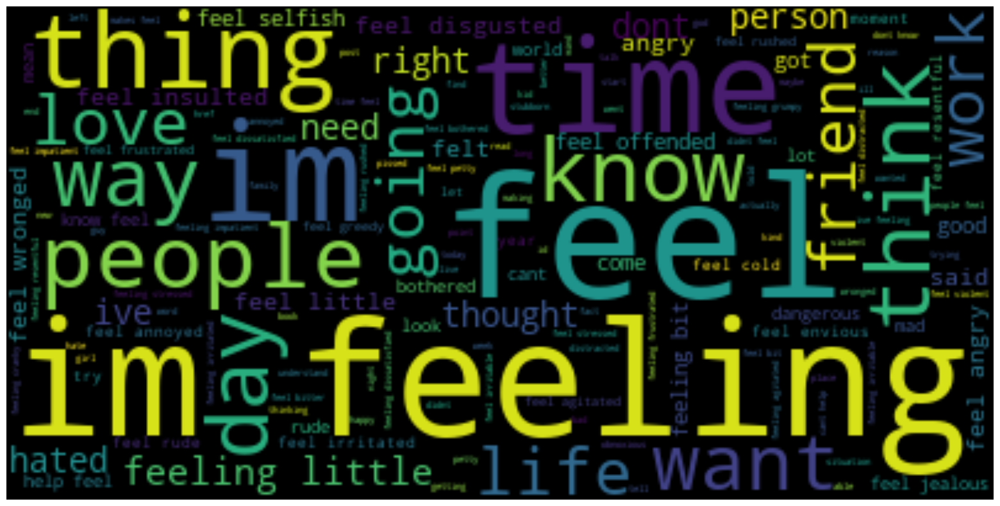

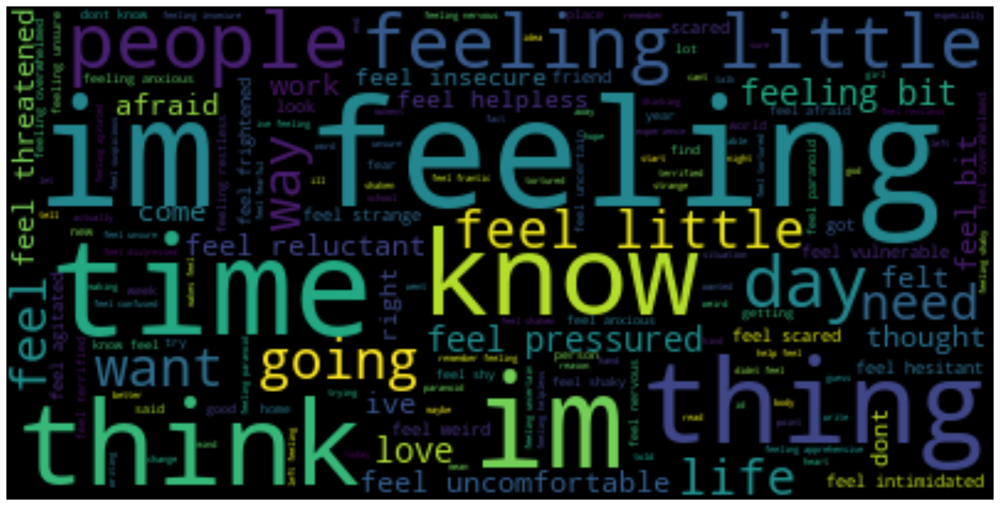

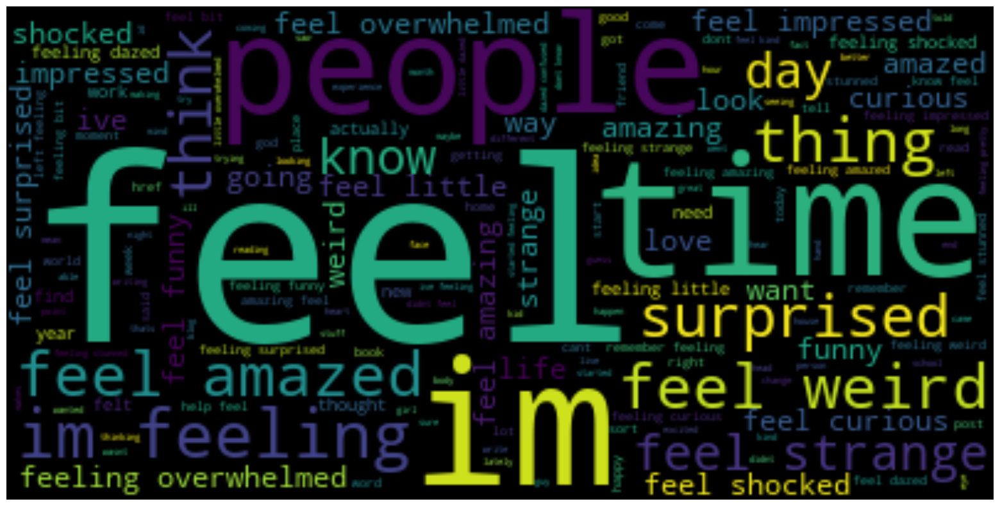

In [46]:
plotWordCloud(sadnessDocx)
plotWordCloud(joyDocx)
plotWordCloud(loveDocx)
plotWordCloud(angerDocx)
plotWordCloud(fearDocx)
plotWordCloud(surpriseDocx)


### Machine learning 
    + Naive Bayes
    + Logistic Regression
    + KNN
    + Decision Tree


In [47]:
#load ML packages
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB

# vectorizer -- converts tests into numbers
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

#metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [48]:
#splitting dataset
from sklearn.model_selection import train_test_split

### Build features from the text

In [114]:
xFeatures = df['clean_text']
yLabels = df['label'].map(emotions)

In [118]:
xFeatures
yLabels

0             fear
1          sadness
2             fear
3          sadness
4             fear
            ...   
416804        love
416805       anger
416806    surprise
416807       anger
416808    surprise
Name: label, Length: 416809, dtype: object

In [119]:
# creating vectorizer
cv = CountVectorizer()
X = cv.fit_transform(xFeatures)

In [120]:
#get features by name
cv.get_feature_names_out()

array(['aa', 'aaa', 'aaaa', ..., 'zzzzzz', 'zzzzzzs', 'zzzzzzz'],
      dtype=object)

In [121]:
# Assuming X is your transformed data using CountVectorizer
num_features = X.shape[1]
print("Number of features:", num_features)


Number of features: 74953


In [122]:
#split dataset 
xTrain, xTest, yTrain, yTest = train_test_split(X, yLabels, test_size= 0.3, random_state=42)

## Building Model

In [123]:
nvModel = MultinomialNB()
nvModel.fit(xTrain, yTrain)

MultinomialNB()

In [124]:
#Accuracy 
#method 1

nvModel.score(xTest, yTest)

0.8605279783754388

In [125]:
#predictions
yPredWithNV = nvModel.predict(xTest)

In [126]:
yPredWithNV

array(['sadness', 'sadness', 'anger', ..., 'love', 'joy', 'sadness'],
      dtype='<U8')

### Make single prediction to see if model works
    + Vectorized the text
    + Applied the model

In [127]:
sampleText = ['I love machine learning']

In [128]:
vect = cv.transform(sampleText).toarray()

In [129]:
#make prediciton
nvModel.predict(vect)

array(['joy'], dtype='<U8')

In [130]:
#checking for prediction probability (percentage) / accuracy score
nvModel.predict_proba(vect)

array([[0.02732683, 0.03497495, 0.69693872, 0.0943616 , 0.13679857,
        0.00959934]])

In [131]:
#Get all classes for the model
nvModel.classes_

array(['anger', 'fear', 'joy', 'love', 'sadness', 'surprise'], dtype='<U8')

In [132]:
np.max(nvModel.predict_proba(vect))

0.6969387176691038

In [133]:
def predictEmotion(sampleText, model):
    myVect = cv.transform(sampleText).toarray()
    #make prediciton
    prediction = model.predict(myVect)
    predictionProba = model.predict_proba(myVect)
    predPercentForAll = dict(zip(model.classes_, predictionProba[0]))
    print("Prediction: {}, Prediction Score: {}".format(prediction[0], np.max(predictionProba)))
    return predPercentForAll

In [134]:
predictEmotion(sampleText, nvModel)

Prediction: joy, Prediction Score: 0.6969387176691038


{'anger': 0.027326828394680796,
 'fear': 0.034974950678194346,
 'joy': 0.6969387176691038,
 'love': 0.09436159689539068,
 'sadness': 0.13679856845771654,
 'surprise': 0.009599337904914818}

In [135]:
predictEmotion(["Im so mad!"], nvModel)

Prediction: anger, Prediction Score: 0.798292271407254


{'anger': 0.798292271407254,
 'fear': 0.030598765165690846,
 'joy': 0.05339577475181497,
 'love': 0.005264827306729232,
 'sadness': 0.110602097265251,
 'surprise': 0.0018462641032604623}

### Modell Evaluation

In [136]:
#classification
print(classification_report(yTest, yPredWithNV))

              precision    recall  f1-score   support

       anger       0.91      0.85      0.88     17295
        fear       0.85      0.80      0.83     14394
         joy       0.85      0.94      0.89     42255
        love       0.84      0.59      0.69     10241
     sadness       0.87      0.94      0.90     36261
    surprise       0.87      0.35      0.50      4597

    accuracy                           0.86    125043
   macro avg       0.86      0.75      0.78    125043
weighted avg       0.86      0.86      0.85    125043



In [137]:
#Confusion Matrix
cm = confusion_matrix(yTest, yPredWithNV)

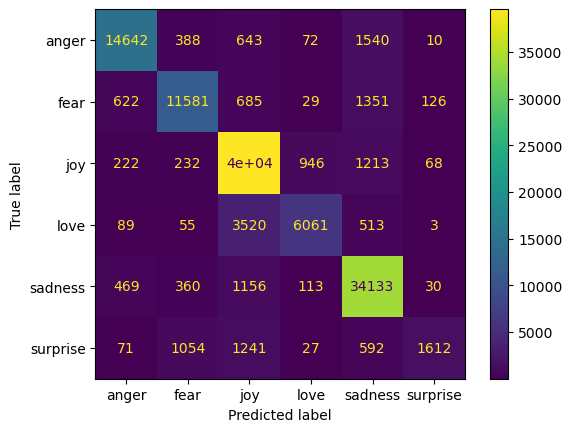

In [138]:
#plotting confusion matrix
cmDisp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels= nvModel.classes_)
cmDisp.plot()

### Save model 

In [71]:
import joblib

In [72]:
modelFile = open("emotionClassifier_nvModel_28_March_2024.pkl", "wb")
joblib.dump(nvModel, modelFile)
modelFile.close()

### Model Interpretation
    + Eli5 --- not for nv model
    + Lime
    + Shap

In [143]:
# logistic regression model
lrModel = LogisticRegression(solver = 'lbfgs', max_iter= 500)
lrModel.fit(xTrain, yTrain)

LogisticRegression(max_iter=500)

In [144]:
yPred = lrModel.predict(xTest)

In [145]:
yPredProb = lrModel.predict_proba(xTest)

In [147]:
yPredProb

array([[1.08100624e-03, 1.84137067e-03, 1.03728973e-03, 7.98941190e-05,
        9.95876726e-01, 8.37133679e-05],
       [8.80356516e-03, 1.31240313e-02, 3.31387246e-02, 2.91443815e-03,
        9.41893226e-01, 1.26014316e-04],
       [9.99802021e-01, 1.88686392e-05, 4.05868569e-05, 1.43730080e-05,
        1.22482441e-04, 1.66778045e-06],
       ...,
       [1.73165387e-03, 6.31383475e-04, 8.23001659e-03, 9.73012758e-01,
        1.62587852e-02, 1.35402560e-04],
       [1.54050342e-03, 4.93497338e-04, 9.96230250e-01, 6.86743693e-04,
        9.36684879e-04, 1.12320395e-04],
       [1.23016441e-03, 1.07907404e-03, 8.35078314e-04, 1.12229460e-03,
        9.95206310e-01, 5.27078307e-04]])

In [148]:
# accuracy for lr model
print("Accuracy score for Logistic Regression model: ", lrModel.score(xTest, yTest))
print("Accuracy score for Naive Bayes model: ", nvModel.score(xTest, yTest))

Accuracy score for Logistic Regression model:  0.8857433043033197
Accuracy score for Naive Bayes model:  0.8605279783754388


In [151]:
modelFile = open("emotionClassifier_lrModel.pkl", "wb")
joblib.dump((cv, lrModel), modelFile)
modelFile.close()

In [76]:
#single prediction
predictEmotion(sampleText, lrModel)

Prediction: joy, Prediction Score: 0.44232400944541356


{'anger': 0.1968068497276093,
 'fear': 0.07954462843193824,
 'joy': 0.44232400944541356,
 'love': 0.05130262495930145,
 'sadness': 0.2141555103472601,
 'surprise': 0.01586637708847727}

In [152]:
predictEmotion(["Im really upset!"], lrModel)

Prediction: joy, Prediction Score: 0.34729710440693906


{'anger': 0.19347467246965794,
 'fear': 0.09923268034578368,
 'joy': 0.34729710440693906,
 'love': 0.015405683356439244,
 'sadness': 0.3359898380120823,
 'surprise': 0.008600021409097798}

In [78]:
lrModel.predict(vect)

array(['joy'], dtype=object)

In [79]:
print("Naive Bayes: ")
predictEmotion(["I hate being so angry all the time"], nvModel)
print("Logisitic Regression: ")
predictEmotion(["I hate being so angry all the time"], lrModel)

Naive Bayes: 
Prediction: anger, Prediction Score: 0.6484139102142676
Logisitic Regression: 
Prediction: anger, Prediction Score: 0.93906036518245


{'anger': 0.93906036518245,
 'fear': 0.013471003181749625,
 'joy': 0.012705433334036342,
 'love': 0.0014680241020311087,
 'sadness': 0.032553800372259696,
 'surprise': 0.0007413738274730377}

In [80]:
classNames = yLabels.unique().tolist()

In [81]:
featureNames = cv.get_feature_names_out()

In [82]:
# def show_weights(model, feature_names, target_names):
#     coefficients = model.coef_
#     for i, class_weights in enumerate(coefficients):
#         print(f"Target: {target_names[i]}")
#         for feature, weight in zip(feature_names, class_weights):
#             print(f"{feature}: {weight}")
#         print()

# # Assuming lrModel is your logistic regression model
# show_weights(lrModel, featureNames, classNames)


In [83]:
print(df.dtypes)

id             int64
text          object
label          int64
Sentiment     object
emotion       object
clean_text    object
dtype: object
